Multiplexed smFISH on mouse cortex

# Imports

In [465]:
import loompy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pickle
from collections import Counter
import scipy
from mpl_toolkits.axes_grid1 import make_axes_locatable
import networkx 
from networkx.algorithms.components.connected import connected_components

plt.rcParams.update({'figure.max_open_warning': 150})

%matplotlib notebook

# Import Data

## smFISH

In [6]:
file_name = '/home/lars/storage/Documents/Cortex_FISH/CountsV1-1.loom'
ds = loompy.connect(file_name)

#Cell size in dictionary. convert pixels to square um (pixel size = 0.065um)
cell_size = dict(zip(ds.CellID, (np.sqrt(ds.CellArea)*0.065)**2))

In [9]:
#Open object properties
obj_prop = pickle.load(open("ObjProp_dict.pkl", 'rb'))

#Load cell ID and XY coordinates into a list
coord_list = []
for i in obj_prop:
    coord_list.append([i, obj_prop[i]['obj_centroid'][0], obj_prop[i]['obj_centroid'][1]])
    
#Place cell ID and X and Y coordinates into dataframe
coord_df = pd.DataFrame(coord_list, columns=['Cell_ID', 'X', 'Y']).set_index('Cell_ID').T
coord_df = coord_df.loc[:,df_fish.columns]

In [665]:
def loompy2data(filename, cutoff_low, cutoff_high, molecules_low):
    """
    Loom file to Panda's dataframe. Perform size and count selection on cells
    Input:
    `filename`(str): Name and path tot the Loom file
    `cutoff_low`(flt): Minimal cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `cutoff_high`(flt): Max cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `molecules_low`(int): Minimal number of molecules
    Returns:
    Panda's dataframe with cells that passed the criteria. df has cell label as column name. 
    Some gene names are corrected
    Metadata is discarded. 
    
    """
    #Read loom file and import to Pandas df
    ds = loompy.connect(filename)
    df=pd.DataFrame(data=ds[:,:], columns=ds.col_attrs['CellID'], index=ds.row_attrs['genes']).astype(int)
    
    #Filter cell size
    for i, j in enumerate(ds.col_attrs['CellID']):
        if ds.col_attrs['CellArea'][i] < cutoff_low or ds.col_attrs['CellArea'][i] > cutoff_high:
            del df[j]
    
    #Filter total molecule count
    for i, j in enumerate(ds.col_attrs['CellID']):
        try: #not all 'CellID' are still present
            if df[j].sum() < molecules_low:
                del df[j]
        except Exception:
            pass
        
    #Filter bad hybridiztion4 (out of focus imaging) and repeat Tbr1
    bad_data = ['Hybridization4_Cnr1', 'Hybridization4_Plp1', 'Hybridization4_Vtn', 'Hybridization11_Tbr1','Hybridization9_Lum']
    for i in bad_data:
        df.drop(i, inplace=True)
     
    #Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
    df= df.rename({'Hybridization11_Tmem6': 'Hybridization11_Tmem2', 'Hybridization12_Kcnip': 'Hybridization12_Kcnip2'})
    
    print('Selected cells with  {}>size<{} and a minimum molecule count of {} molecules'.format(cutoff_low, cutoff_high, molecules_low))
    print('Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2')
    return df

    
df_fish = loompy2data(file_name, 2000, 60000, 20)

gene_sort_fish = ['Hybridization2_Gad2', 'Hybridization12_Slc32a1', 'Hybridization10_Crhbp', 'Hybridization12_Kcnip2', 'Hybridization13_Cnr1', 'Hybridization6_Vip', 'Hybridization5_Cpne5', 'Hybridization8_Pthlh',  'Hybridization10_Crh', 
'Hybridization1_Tbr1', 'Hybridization9_Lamp5', 'Hybridization7_Rorb', 'Hybridization11_Syt6',
'Hybridization1_Aldoc', 'Hybridization2_Gfap', 'Hybridization8_Serpinf1', 'Hybridization3_Mfge8',
 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization8_Pdgfra', 'Hybridization6_Bmp4','Hybridization6_Itpr2','Hybridization11_Tmem2', 'Hybridization7_Ctps','Hybridization5_Klk6','Hybridization9_Anln',
 'Hybridization3_Mrc1','Hybridization3_Hexb', 
 'Hybridization13_Ttr',
 'Hybridization1_Foxj1',
 'Hybridization12_Vtn',
 'Hybridization2_Flt1',
 'Hybridization10_Apln',
 'Hybridization5_Acta2'
 ]

gene_sort = ['Gad2', 'Slc32a1', 'Crhbp', 'Kcnip2', 'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh',             
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem2',  'Ctps',  'Klk6', 'Anln',   
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2'] 

df_fish = df_fish.loc[gene_sort_fish]


#Exclude the cells in the bleached area
coord_df = coord_df.loc[:, coord_df.loc['X'] < 25000]
#include_cells = coord_df.loc[:, coord_df.loc['X'] < 25000].columns.tolist()
df_fish = df_fish.loc[:, coord_df.columns]
print('Excluded cells from the bleached area')

print('\nFinal shape: {} genes, {} cells'.format(df_fish.shape[0], df_fish.shape[1]))

Selected cells with  2000>size<60000 and a minimum molecule count of 20 molecules
Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
Excluded cells from the bleached area

Final shape: 34 genes, 5208 cells


In [666]:
# normalize data by total number of molecules per cell and per gene.
df_fish_totmol = df_fish.divide(df_fish.sum(axis=1), axis=0) * df_fish.shape[0] #Corrected for total molecules per gene
df_fish_totmol = df_fish_totmol.divide(df_fish_totmol.sum(axis=0), axis=1) * df_fish.shape[1] #Corrected for the total per cell
df_fish_totmol

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,1217,2808,5162,532,3607,3251,2757,1228,1234,4653
Hybridization2_Gad2,53.784267,116.093907,59.047534,70.706421,548.995818,76.153191,134.570315,15.623643,32.582296,112.453076,...,109.521545,0.000000,44.268444,117.853948,89.666315,33.159412,28.295577,51.707916,139.256872,186.001151
Hybridization12_Slc32a1,42.570987,80.403683,109.052848,78.351146,514.760089,0.000000,53.257127,0.000000,90.262674,0.000000,...,0.000000,27.505346,0.000000,54.415095,27.600269,0.000000,156.774368,0.000000,0.000000,0.000000
Hybridization10_Crhbp,83.870682,0.000000,107.424533,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,153.438488,...,0.000000,54.189303,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Hybridization12_Kcnip2,5.317842,502.189559,681.128025,137.023520,35.073989,158.120287,266.108936,151.386994,78.927431,0.000000,...,0.000000,20.615321,382.985657,312.679175,441.311274,0.000000,19.583792,0.000000,0.000000,257.468358
Hybridization13_Cnr1,19.051987,71.966849,97.609831,490.907807,1172.807572,566.490216,286.012842,271.183581,201.978319,69.709891,...,0.000000,98.476737,164.652593,146.115805,617.603682,41.111174,105.242916,0.000000,0.000000,251.569075
Hybridization6_Vip,289.991224,84.262381,114.286464,164.222677,735.633035,221.091676,167.439058,90.718650,47.297260,108.826428,...,0.000000,576.507403,0.000000,627.292162,57.849698,240.675078,287.521874,300.241912,134.765793,49.091606
Hybridization5_Cpne5,0.000000,489.380594,82.969377,59.610967,35.603525,0.000000,162.075937,592.737115,137.346946,0.000000,...,0.000000,0.000000,279.912850,0.000000,419.975668,0.000000,0.000000,0.000000,0.000000,1140.460497
Hybridization8_Pthlh,152.647395,0.000000,0.000000,0.000000,671.193674,0.000000,190.964841,155.197415,0.000000,0.000000,...,0.000000,98.626312,0.000000,0.000000,98.966680,164.694469,0.000000,0.000000,0.000000,0.000000
Hybridization10_Crh,111.760355,0.000000,286.293225,0.000000,184.279701,0.000000,838.886187,113.627345,0.000000,136.307783,...,0.000000,72.208973,160.977371,142.854344,72.458173,120.580586,0.000000,0.000000,337.594954,0.000000
Hybridization1_Tbr1,81.142869,259.353380,447.701277,137.854163,48.028996,371.183912,218.639716,304.609419,66.171578,22.838161,...,88.971181,96.788028,1024.917509,319.133704,210.431113,107.749833,57.465654,0.000000,175.975397,68.681970


## Single Cell

# Comparison smFISH & Single Cell

## Counts

In [ ]:
# also compare the genes to see where the difference is coming from. 

## tSNE comparison

# tSNE

In [193]:
def scatter_tSNE(tSNE_data):
    
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(tSNE_data[:,0], tSNE_data[:,1], lw=0, s=40, alpha = 0.1, c = 'blue')
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('on')
    ax.axis('tight')
    
    return f, ax, sc

<IPython.core.display.Javascript object>


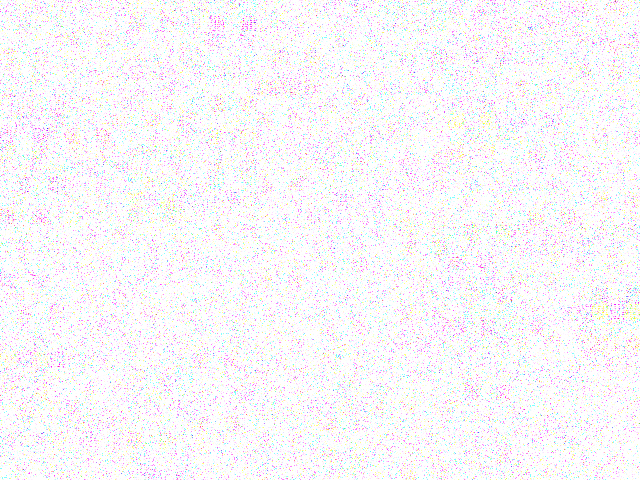

In [194]:
pca = PCA()
pc = pca.fit_transform(df_fish_totmol.T)

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ration')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

<IPython.core.display.Javascript object>


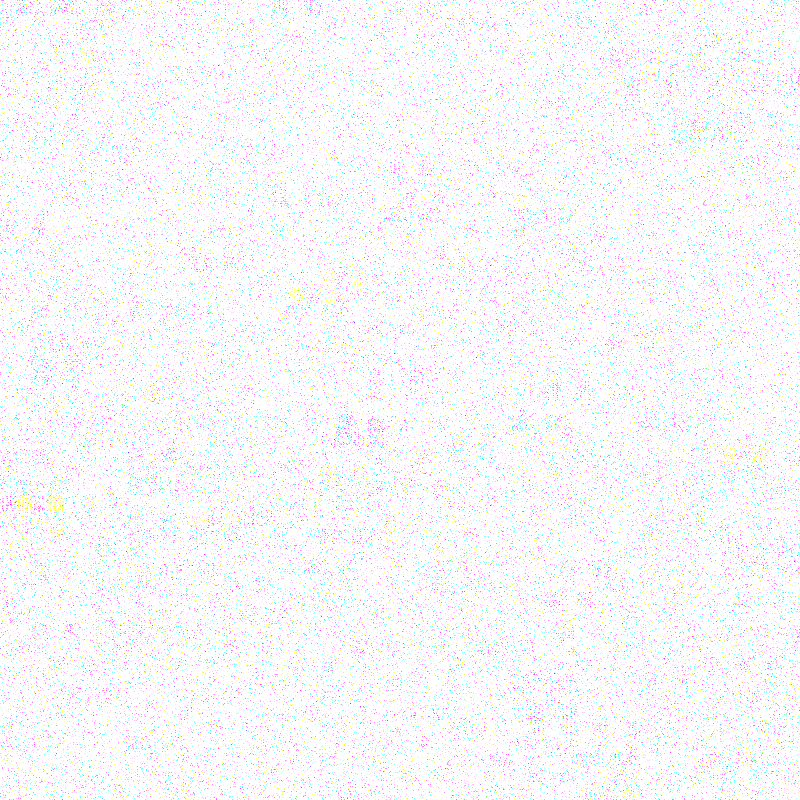

In [195]:
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
#Transpose the data to work on the cells
tSNE_points = model.fit_transform(pc[:,:33])
scatter_tSNE(tSNE_points)
pickle.dump(tSNE_points, open( "tSNE_points_df_tot_mol_5028cells_p50_ea15.p", "wb" ))

<IPython.core.display.Javascript object>


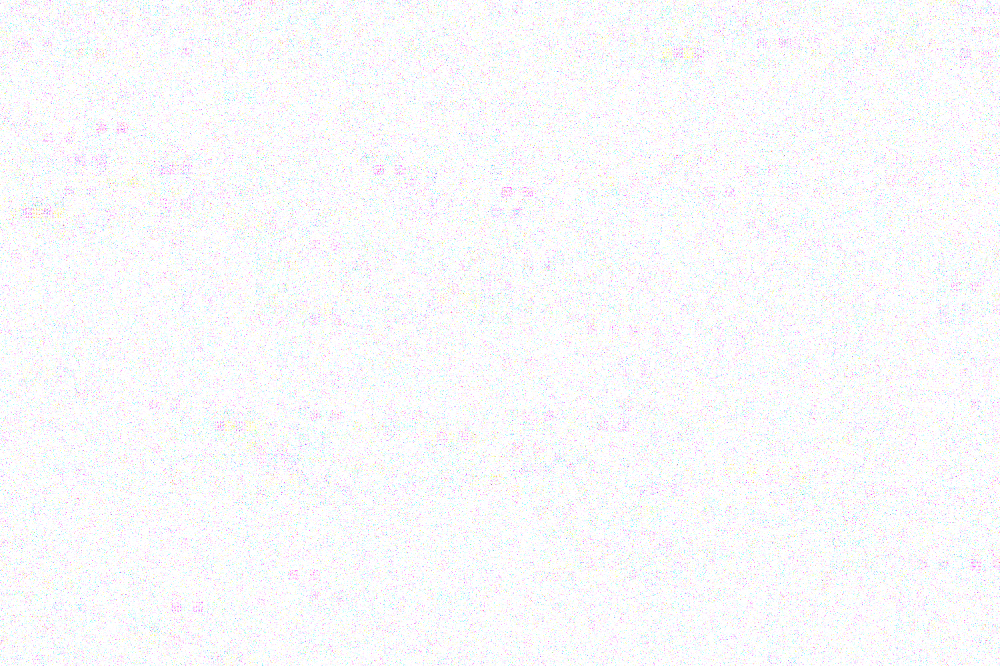

/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/home/lars/programs/anaconda2/envs/py36/lib/python3.6/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


In [238]:
#Expression plot on tSNE points
plt.figure(figsize=(15,10))
gs = plt.GridSpec(5,8)

for i, gene in enumerate(gene_sort_fish):
    plt.subplot(gs[i])
    filt = df_fish.index == gene
    levels = df_fish_totmol.loc[filt,:].values.flat[:]
    levels = np.clip(levels, np.percentile(levels, 10), np.percentile(levels,90))
    plt.scatter(tSNE_points[:,0], tSNE_points[:,1],color=plt.cm.coolwarm(levels/max(levels)), lw=0, alpha=.5,s=2)
    for label in plt.gca().axes.get_xticklabels():
        label.set_visible(False)
    for label in plt.gca().axes.get_yticklabels():
        label.set_visible(False)
    plt.title(gene.split('_')[1])
plt.tight_layout()

# Clustering

In [197]:
def mean_expression(df, labels):
    """
    Make dataframe with mean expression
    
    """
    #Make df with count averages per cluster
    df_count_average = pd.DataFrame(index=df.index, columns=np.sort(np.unique(labels))) #np.unique(labels_a))
    for l in np.unique(labels):
        filt = labels == l
        mean = np.array(df.loc[:,filt].T.mean())
        #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
        if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
            df_count_average[l] = mean
    return df_count_average

def heat_map(df, labels, sort=None, save=False, name=''):
    """
    Plot heat_map of a sorted dataframe
    
    """
    #Find the name of the input df, for logging
    df_input_name =[x for x in globals() if globals()[x] is df][0]
    print('DF used for plot: {}'.format(df_input_name))
    
    if sort == None:
        optimal_order = np.unique(labels)    
    else:
        optimal_order = sort
    print('Order of clusters: {}'.format(optimal_order))
    
    #Sort the cells according to the optimal cluster order
    optimal_sort_cells = []
    for i in optimal_order:
        optimal_sort_cells.extend(label_cells[i])
    
    #Create a list of optimal sorted cell labels
    optimal_sort_labels = []
    for i in optimal_sort_cells:
        optimal_sort_labels.append(cell_labels[i])
    
    fig, axHM = plt.subplots(figsize=(14,6))
    #z = df.loc[:,optimal_sort_cells].values
    #z = z/np.percentile(z, 99.5, 1)[:,None]
    
    df_full = df # _fish_log
    z = df_full.values
    z = z/np.percentile(z, 99, 1)[:,None]
    z = pd.DataFrame(z, index=df_full.index, columns=df_full.columns)
    z = z.loc[:,optimal_sort_cells].values
    print(z.shape)
    
    im = axHM.pcolor(z, cmap='viridis', vmax=1)

    plt.yticks(np.arange(0.5, len(df.index), 1), gene_sort, fontsize=8)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=len(labels))
    print(len(labels))
    plt.title(df_input_name)

    divider = make_axes_locatable(axHM)
    axLabel = divider.append_axes("top", .3, pad=0, sharex=axHM)

    optimal_sort_labels = np.array(optimal_sort_labels)
    axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='jet')
        #Colors, see below:
    #axLabel.pcolor(label_colors_rgb) #label_colors_hex
    
    
    
    axLabel.set_xlim(xmax=len(labels))
    axLabel.axis('off')
    
    cax = fig.add_axes([.91, 0.13, 0.01, 0.22])
    colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
    colorbar.set_ticklabels(['0', 'max'])
    
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=300)
    
    
def gen_labels(df, model):
    """
    Generate cell labels from model.
    Input:
    `df`: Panda's dataframe that has been used for the clustering. (used to get
    the names of colums and rows)
    `model`(obj): Clustering object
    Returns (in this order):
    `cell_labels` = Dictionary coupling cellID with cluster label
    `label_cells` = Dictionary coupling cluster labels with cellID
    `cellID` = List of cellID in same order as labels
    `labels` = List of cluster labels in same order as cells
    `labels_a` = Same as "labels" but in numpy array
    
    """
    if str(type(model)).startswith("<class 'sklearn.cluster"):
        cell_labels = dict(zip(df.columns, model.labels_))
        label_cells = {}
        for l in np.unique(model.labels_):
            label_cells[l] = []
        for i, label in enumerate(model.labels_):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model.labels_)
        labels_a = model.labels_
    elif type(model) == np.ndarray:
        cell_labels = dict(zip(df.columns, model))
        label_cells = {}
        for l in np.unique(model):
            label_cells[l] = []
        for i, label in enumerate(model):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model)
        labels_a = model
    else:
        print('Error wrong input type')
    
    return cell_labels, label_cells, cellID, labels, labels_a


In [791]:

    


def iterative_clustering(df, expression_threshold, alpha, min_clust_size, dataset_fraction = 0.1, 
                         allow_level_difference=False, max_cycles = 50, post_merge=False, post_merge_rho=0.90):
    
    def cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction, allow_level_difference=False):
        """
        Check if the clusters pass the criteria

        """
        evaluation = [0,0]

        #Investigate if there are genes enriched in a cluster
        enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
        enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()

        if df1.shape[1] > (dataset_fraction * df.shape[1]) or df2.shape[1] > (dataset_fraction * df.shape[1]):
            evaluation[0] = 3

        elif enriched_df1 == [] and enriched_df2 == []: #No enriched genes in both groups
            evaluation[0] = 0
        elif enriched_df1 == enriched_df2: #Same enriched genes for both groups, level difference
            if allow_level_difference == True:
                evaluation[0] = 1
            else:
                evaluation[0] = 0
        elif enriched_df1 != enriched_df2: #At least one gene differentialy enriched
            evaluation[0] = 2



        #Test if there is a significant difference in the enriched genes between the groups
        diff_expressed = {'df1':[],
                          'df2':[],
                          'both':[]}
        for gene in [i for i in enriched_df1 if i in enriched_df2]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['both'].append([gene, test_p])
                evaluation[1] = 1
        for gene in [i for i in enriched_df1 if i not in enriched_df2]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['df1'].append([gene, test_p])
                evaluation[1] = 2
        for gene in [i for i in enriched_df2 if i not in enriched_df1]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['df2'].append([gene, test_p])
                evaluation[1] = 2
        return evaluation

    def re_cluster(dfs = []):
        """
        Evaluate a list of clusters (dataframes) by splitting them again and 
        evaluating the daughter clusters.
        Input:
        `dfs`(list): List of Pandas dataframes containing one cluster.

        """
        re_evaluation = []
        for d in dfs:
            split = AgglomerativeClustering(n_clusters=2).fit(d.T)
            split_labels = split.labels_ 
            df_daughter_1 = d.loc[:,split_labels == np.unique(split_labels)[0]]
            df_daughter_2 = d.loc[:,split_labels == np.unique(split_labels)[1]]
            re_evaluation.append(cluster_evaluation(df_daughter_1, df_daughter_2, expression_threshold, 
                                                    alpha, dataset_fraction,
                                                    allow_level_difference=allow_level_difference))
        return(re_evaluation)  
    
    def to_graph(l):
        """
        Make a graph of a list of lists
        From: https://stackoverflow.com/questions/4842613/merge-lists-that-share-common-elements

        """
        G = networkx.Graph()
        for part in l:
            # each sublist is a bunch of nodes
            G.add_nodes_from(part)
            # it also imlies a number of edges:
            G.add_edges_from(to_edges(part))
        return G

    def to_edges(l):
        """ 
        treat `l` as a Graph and returns it's edges 
        to_edges(['a','b','c','d']) -> [(a,b), (b,c),(c,d)]
        From: https://stackoverflow.com/questions/4842613/merge-lists-that-share-common-elements

        """
        it = iter(l)
        last = next(it)

        for current in it:
            yield last, current
            last = current  
            
    def mean_expression(df, labels):
        """
        Make dataframe with mean expression per label.

        """
        #Make df with count averages per cluster
        df_count_average = pd.DataFrame(index=df.index, columns=np.sort(np.unique(labels))) #np.unique(labels_a))
        for l in np.unique(labels):
            filt = labels == l
            mean = np.array(df.loc[:,filt].T.mean())
            #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
            if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
                df_count_average[l] = mean
        return df_count_average

    #=========================================================================
    finished_clusters = []
    label_ofset = 0
    finished = False

    #Make matrix for labels. First row all zeros
    label_matrix = pd.DataFrame(data= np.zeros((1, df.shape[1])), index = ['Level_0'], columns=df.columns, dtype='Int64')

    for cycle, x in enumerate(range(max_cycles)):

        previous_level = 'Level_{}'.format(cycle)
        current_level = 'Level_{}'.format(cycle + 1)

        if list(set(label_matrix.loc[previous_level]) - set(finished_clusters)) == []:
            print('\nNo difference between the last two label levels. Clustering completed.')
            finished = True
            break

        #Add row and copy labels
        label_matrix.loc[current_level] = label_matrix.loc[previous_level]

        #Loop through all labels that are not in finished_clusters
        for old_label in [i for i in np.unique(label_matrix.loc[current_level]) if i not in finished_clusters]:
            label_ofset += 2
            print(current_level, 'label: ', old_label)

            #Create dataframe to split
            filt = label_matrix.loc[current_level] == old_label
            df_to_split = df.loc[:,filt]

            #Cluster dataframe into two clusters
            split = AgglomerativeClustering(n_clusters=2).fit(df_to_split.T)
            split_labels = split.labels_ + label_ofset #Labels are 0 and 1, shift them with the clustering step
            unique_split_labels = np.unique(split_labels)
            print('unique_split_labels:  {}'.format(repr(unique_split_labels)))

            #Check if all the clusters are larger than the min_clust_size
            if all(i > min_clust_size for i in list(Counter(split_labels).values())):

                #Make df1 & df2
                df1 = df_to_split.loc[:,split_labels == unique_split_labels[0]]
                df2 = df_to_split.loc[:,split_labels == unique_split_labels[1]]

                #Evaluate split
                evaluation = cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction)

                print('LABELS: {} EVALUATION: {}'.format(unique_split_labels, evaluation))
                #List of the labels that are valid clusters (or will be in the next cycle)
                valid_labels = []

                #_____________________________________________________________________
                if evaluation[0] == 3:
                    threshold = dataset_fraction * df.shape[1]
                    if df1.shape[1] > threshold and df2.shape[1] > threshold:
                        valid_labels.extend(unique_split_labels)
                    elif df1.shape[1] > threshold:
                        valid_labels.append(unique_split_labels[0])
                        re_evaluation = re_cluster([df2])
                        if re_evaluation[0][1] == 0:
                            finished_clusters.append(unique_split_labels[1])
                            valid_labels.append(unique_split_labels[1])
                        else: #Difference in daughters, continue clustering
                            valid_labels.append(unique_split_labels[1])
                    elif df2.shape[1] > threshold:
                        valid_labels.append(unique_split_labels[1])
                        re_evaluation = re_cluster([df1])
                        if re_evaluation[0][1] == 0:
                            finished_clusters.append(unique_split_labels[0])
                            valid_labels.append(unique_split_labels[0])
                        else: #Difference in daughters, continue clustering
                            valid_labels.append(unique_split_labels[0])


                #No enriched genes, NO expression difference
                elif evaluation[0] == 0:
                    re_evaluation = re_cluster([df1, df2])
                    #No valid daughter clusters in the next cycle
                    if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0:
                        finished_clusters.append(old_label)
                        print('Encountered a cluster without expression: {}{}'.format(current_level, old_label))
                    #Valid daughter clusters in the next cycle
                    else:
                        valid_labels.extend(unique_split_labels)

                #Different genes enriched, expression difference
                elif evaluation[0] == 2 and evaluation[1] == 2:

                    re_evaluation = re_cluster([df1, df2])
                    print('re_evaluation {}'.format(re_evaluation))
                    #First cluster
                    if re_evaluation[0][1] == 0: #no difference in daughter clusters, current cluster finished
                        print('no future 1')
                        finished_clusters.append(unique_split_labels[0])
                        valid_labels.append(unique_split_labels[0])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[0])
                    #Second cluster
                    if re_evaluation[1][1] == 0: #no difference in daughter clusters, current cluster finished
                        print('no future 2')
                        finished_clusters.append(unique_split_labels[1])
                        valid_labels.append(unique_split_labels[1])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[1])    


                #Different genes enriched, NO expression difference
                elif evaluation[0] == 2 and evaluation[1] == 0:
                    print('Encounterd a difference but no significant difference {} {}-->{}'.format(current_level, old_label, unique_split_labels))
                    re_evaluation = re_cluster([df1, df2])
                    if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0: #No valid daughter clusters
                        finished_clusters.append(old_label)
                        print('    stopped')
                    else:
                        print('    continued\n')
                        valid_labels.extend(unique_split_labels)

                #Same or more enriched, expression level difference
                elif evaluation[0] > 0 and evaluation[1] == 1:
                    print('Encountered a split with similar genes')
                    if allow_level_difference == True:
                        valid_labels.extend(unique_split_labels)
                        finished_clusters.extend(unique_split_labels)
                    else:
                        finished_clusters.append(old_label)


                #Same enriched, NO expression difference
                elif evaluation[0] == 1 and evaluation[1] == 0:
                    finished_clusters.append(old_label) #Not a valid split, current cluster finished  

                else:
                    print('Did not fit the criteria: {} in: {} {}'.format(evaluation, current_level, old_label))

                #_____________________________________________________________________

            else:
                print('toosmall: {}'.format(old_label))
                finished_clusters.append(old_label)

            #Add labels to matrix
            final_split_labels = [old_label if i not in valid_labels else i for i in split_labels]
            for c, i in enumerate(filt):
                if i == True:
                    count_true = Counter(filt[:c])[True] #Count how many Trues already have been passed
                    label_matrix.loc[current_level][c] = final_split_labels[count_true] #Add the new labels to the label matrix
            print('fc ', finished_clusters)
    
    if finished == False:
        print('Max number of cycles reached. Possibly there is more structure with more rounds of clustering.')
    print('\nClustering finished. Result {} clusters with labels: {}\n'.format(len(np.unique(label_matrix.iloc[-1])), np.unique(label_matrix.iloc[-1])))
    
    if post_merge == True:
        #Make mean expression dataframe with last level labels and cross correlate clusters
        mean_exp = mean_expression(df, label_matrix.iloc[-1])
        clust_correlation = mean_exp.corr(method='pearson').values
        clust_correlation = np.triu(clust_correlation, k=1)
        #Select clusters with rho > threshold and group similar clusters
        connected_clusters = np.where(clust_correlation > post_merge_rho)
        connected_clusters = [list(i) for i in zip(connected_clusters[0], connected_clusters[1])]
        G = to_graph(connected_clusters)
        cluster_sets = connected_components(G)
    
            
        label_matrix.loc['Post_merge'] = label_matrix.iloc[-1]
        max_label = label_matrix.iloc[-1].max()
        print('Post merging clusters that have a Spearman rho > {}'.format(post_merge_rho))
        for n, s in enumerate(cluster_sets):
            labels_to_merge = np.take(np.unique(label_matrix.iloc[-2]), list(s))
            eval_simularity = []
            for i in itertools.combinations(labels_to_merge, 2):
                filt = label_matrix.iloc[-2] == i[0]
                df_sim1 = df.loc[:, filt]
                filt = label_matrix.iloc[-2] == i[1]
                df_sim2 = df.loc[:, filt]
                eval_simularity.append(cluster_evaluation(df_sim1, df_sim2, expression_threshold, alpha, 
                                                          dataset_fraction, allow_level_difference=False)[1])
            print(eval_simularity)    
            if 2 not in eval_simularity:
                label_matrix.loc['Post_merge' , label_matrix.loc['Post_merge'].isin(labels_to_merge)] = max_label + n + 1
                print('Merged clusters {} into cluster {}'.format(labels_to_merge, max_label + n + 1))
            else:
                print('Did NOT merge clusters {}, there is an expression difference'.format(labels_to_merge))    
            
            
            
            
            
        print('\nMerging finished. Result {} clusters with labels: {}\n'.format(len(np.unique(label_matrix.iloc[-1])), 
                                                                                np.unique(label_matrix.iloc[-1])))
    return label_matrix
                

label_matrix = iterative_clustering(df_fish_totmol, 
                     expression_threshold = 600, 
                     alpha = 0.1e-20,
                     min_clust_size = 25, 
                     dataset_fraction = 0.05, 
                     allow_level_difference=False, 
                     max_cycles = 50,
                     post_merge = True,
                     post_merge_rho = 0.86) #0.87

"""df_fish_totmol, 
                     expression_threshold = 550, 
                     alpha = 0.1e-20,
                     min_clust_size = 10, 
                     dataset_fraction = 0.1, 
                     allow_level_difference=False, 
                     max_cycles = 50)"""

Level_1 label:  0
unique_split_labels:  array([2, 3])
LABELS: [2 3] EVALUATION: [3, 2]
fc  []
Level_2 label:  2
unique_split_labels:  array([4, 5])
LABELS: [4 5] EVALUATION: [3, 2]
fc  []
Level_2 label:  3
unique_split_labels:  array([6, 7])
LABELS: [6 7] EVALUATION: [3, 1]
fc  [7]
Level_3 label:  4
unique_split_labels:  array([8, 9])
LABELS: [8 9] EVALUATION: [3, 0]
fc  [7]
Level_3 label:  5
unique_split_labels:  array([10, 11])
LABELS: [10 11] EVALUATION: [3, 1]
fc  [7, 11]
Level_3 label:  6
unique_split_labels:  array([12, 13])
LABELS: [12 13] EVALUATION: [3, 0]
fc  [7, 11, 13]
Level_4 label:  8
unique_split_labels:  array([14, 15])
LABELS: [14 15] EVALUATION: [3, 2]
fc  [7, 11, 13]
Level_4 label:  9
unique_split_labels:  array([16, 17])
LABELS: [16 17] EVALUATION: [3, 2]
fc  [7, 11, 13, 17]
Level_4 label:  10
unique_split_labels:  array([18, 19])
LABELS: [18 19] EVALUATION: [0, 1]
fc  [7, 11, 13, 17]
Level_4 label:  12
unique_split_labels:  array([20, 21])
LABELS: [20 21] EVALUATIO

fc  [7, 11, 13, 17, 21, 15, 18, 19, 32, 37, 39, 27, 33, 45, 49, 51, 55, 56, 57, 61, 64, 65, 66, 67, 68, 69, 59, 72, 73, 75, 77, 79, 83, 80, 86, 87, 89, 91, 94, 95, 96, 97]

No difference between the last two label levels. Clustering completed.

Clustering finished. Result 42 clusters with labels: [ 7 11 13 15 17 18 19 21 27 32 33 37 39 45 49 51 55 56 57 59 61 64 65 66 67
 68 69 72 73 75 77 79 80 83 86 87 89 91 94 95 96 97]

Post merging clusters that have a Spearman rho > 0.86
[1, 1, 1, 0, 0, 0]
Merged clusters [ 7 32 13 33] into cluster 98
[1, 1, 1]
Merged clusters [11 18 19] into cluster 99
[1]
Merged clusters [17 79] into cluster 100
[1]
Merged clusters [69 37] into cluster 101
[0]
Merged clusters [97 49] into cluster 102
[1]
Merged clusters [57 66] into cluster 103

Merging finished. Result 33 clusters with labels: [ 15  21  27  39  45  51  55  56  59  61  64  65  67  68  72  73  75  77
  80  83  86  87  89  91  94  95  96  98  99 100 101 102 103]



'df_fish_totmol, \n                     expression_threshold = 550, \n                     alpha = 0.1e-20,\n                     min_clust_size = 10, \n                     dataset_fraction = 0.1, \n                     allow_level_difference=False, \n                     max_cycles = 50)'

In [ ]:
"""        label_matrix.loc['Post_merge'] = label_matrix.iloc[-1]
        max_label = label_matrix.iloc[-1].max()
        print('Post merging clusters that have a Spearman rho > {}'.format(post_merge_rho))
        for n, s in enumerate(cluster_sets):
            labels_to_merge = np.take(np.unique(label_matrix.iloc[-2]), list(s))
            label_matrix.loc['Post_merge' , label_matrix.loc['Post_merge'].isin(labels_to_merge)] = max_label + n + 1
            print('Merged clusters {} into cluster {}'.format(labels_to_merge, max_label + n + 1))"""

33
DF used for plot: df_fish_totmol
Order of clusters: [ 15  21  27  39  45  51  55  56  59  61  64  65  67  68  72  73  75  77
  80  83  86  87  89  91  94  95  96  98  99 100 101 102 103]


<IPython.core.display.Javascript object>


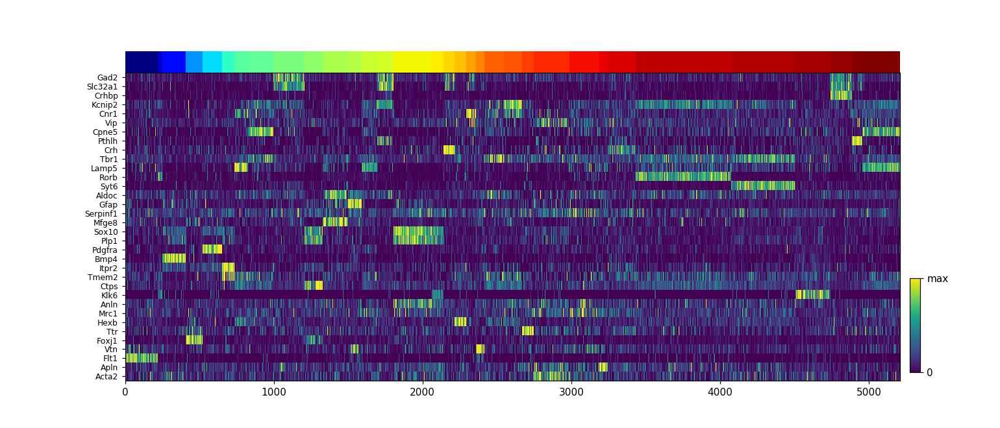

(34, 5208)
5208


In [792]:
last_level = label_matrix.iloc[-1]

cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df_fish_totmol, np.array(last_level))
print(len(np.unique(labels_a)))
heat_map(df_fish_totmol, labels)

In [695]:
filt = label_matrix.iloc[-2] == 72
df_1 = df_fish_totmol.loc[:, filt]
filt = label_matrix.iloc[-2] == 61
df_2 = df_fish_totmol.loc[:, filt]

def cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction, allow_level_difference=False):
    """
    Check if the clusters pass the criteria

    """
    evaluation = [0,0]

    #Investigate if there are genes enriched in a cluster
    enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
    enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()
    print(enriched_df1, enriched_df2)

    if df1.shape[1] > (dataset_fraction * df.shape[1]) or df2.shape[1] > (dataset_fraction * df.shape[1]):
        evaluation[0] = 3

    elif enriched_df1 == [] and enriched_df2 == []: #No enriched genes in both groups
        evaluation[0] = 0
    elif enriched_df1 == enriched_df2: #Same enriched genes for both groups, level difference
        if allow_level_difference == True:
            evaluation[0] = 1
        else:
            evaluation[0] = 0
    elif enriched_df1 != enriched_df2: #At least one gene differentialy enriched
        evaluation[0] = 2



    #Test if there is a significant difference in the enriched genes between the groups
    diff_expressed = {'df1':[],
                      'df2':[],
                      'both':[]}
    for gene in [i for i in enriched_df1 if i in enriched_df2]:
        test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
        if test_p < alpha:
            diff_expressed['both'].append([gene, test_p])
            evaluation[1] = 1
    for gene in [i for i in enriched_df1 if i not in enriched_df2]:
        test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
        if test_p < alpha:
            diff_expressed['df1'].append([gene, test_p])
            evaluation[1] = 2
    for gene in [i for i in enriched_df2 if i not in enriched_df1]:
        test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
        if test_p < alpha:
            diff_expressed['df2'].append([gene, test_p])
            evaluation[1] = 2
    return evaluation

df = df_fish_totmol
cluster_evaluation(df_1, df_2, 550, 0.1e20, 0.05, allow_level_difference=False)

['Hybridization7_Sox10', 'Hybridization13_Plp1'] ['Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization7_Ctps', 'Hybridization1_Foxj1']


[2, 2]

In [707]:
label_matrix_2

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,1217,2808,5162,532,3607,3251,2757,1228,1234,4653
Level_0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Level_1,2,2,2,2,2,2,2,2,2,2,...,2,2,2,3,2,2,2,2,2,2
Level_2,4,5,5,4,4,4,4,4,4,4,...,4,4,4,6,4,4,4,4,4,4
Level_3,8,10,10,8,8,8,8,8,8,9,...,9,8,8,12,8,9,9,9,9,8
Level_4,14,18,18,14,14,14,14,14,14,16,...,16,14,14,20,14,16,17,16,16,14
Level_5,22,28,28,22,22,22,22,22,22,26,...,27,22,22,32,22,26,17,26,26,22
Level_6,34,28,28,34,34,34,34,35,34,38,...,27,34,34,32,35,38,17,38,38,35
Level_7,44,28,28,44,44,44,44,47,45,50,...,27,44,44,32,46,50,17,50,50,47
Level_8,53,28,28,52,52,52,52,56,45,60,...,27,52,52,32,54,60,17,60,60,57
Level_9,65,28,28,62,62,62,62,56,45,72,...,27,62,63,32,67,72,17,72,73,57


In [752]:
post_merge_rho = 0.89

#Make mean expression dataframe with last level labels and cross correlate clusters
mean_exp = mean_expression(df, label_matrix.iloc[-1])
clust_correlation = mean_exp.corr(method='spearman').values
clust_correlation = np.triu(clust_correlation, k=1)

#Select clusters with rho > threshold and group similar clusters
connected_clusters = np.where(clust_correlation > post_merge_rho)
connected_clusters = [list(i) for i in zip(connected_clusters[0], connected_clusters[1])]
G = to_graph(connected_clusters)
cluster_sets = connected_components(G)

label_matrix_2 = label_matrix.copy()
label_matrix_2.loc['Post_merge'] = label_matrix_2.iloc[-1]
max_label = label_matrix_2.iloc[-1].max()
print('Post merging clusters that have a Spearman rho > {}'.format(post_merge_rho))
for n, s in enumerate(cluster_sets):
    labels_to_merge = np.take(np.unique(label_matrix_2.iloc[-2]), list(s))
    eval_simularity = []
    for i in itertools.combinations([7, 13, 33], 2):
        filt = label_matrix_2.iloc[-2] == i[0]
        df_sim1 = df_fish_totmol.loc[:, filt]
        filt = label_matrix_2.iloc[-2] == i[1]
        df_sim2 = df_fish_totmol.loc[:, filt]

        df = df_fish_totmol
        eval_simularity.append(cluster_evaluation(df_sim1, df_sim2, 550, 0.1e20, 0.05, allow_level_difference=False)[1])
    print(eval_simularity)
    if set(eval_simularity) == {1}:
        label_matrix_2.loc['Post_merge' , label_matrix_2.loc['Post_merge'].isin(labels_to_merge)] = max_label + n + 1
        print('Merged clusters {} into cluster {}'.format(labels_to_merge, max_label + n + 1))
    else:
        print('Did NOT merge clusters {}, there is an expression difference'.format(labels_to_merge))

Post merging clusters that have a Spearman rho > 0.89
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
[1, 1, 1]
Merged clusters [ 7 13 33] into cluster 98
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
[1, 1, 1]
Merged clusters [28 11] into cluster 99
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
[1, 1, 1]
Merged clusters [72 61] into cluster 100


In [741]:
import itertools

eval_simulatity = set([])
for i in itertools.combinations([7, 13, 33], 2):
    filt = label_matrix_2.iloc[-2] == i[0]
    df_1 = df_fish_totmol.loc[:, filt]
    filt = label_matrix_2.iloc[-2] == i[1]
    df_2 = df_fish_totmol.loc[:, filt]

    df = df_fish_totmol
    eval_simulatity.append(cluster_evaluation(df_1, df_2, 550, 0.1e20, 0.05, allow_level_difference=False)[1])
print(comparison)

['Hybridization7_Rorb'] ['Hybridization7_Rorb']
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
['Hybridization7_Rorb'] ['Hybridization7_Rorb']
[1, 1, 1]


In [730]:
set([1,1,1] ) == {1}

True

<IPython.core.display.Javascript object>


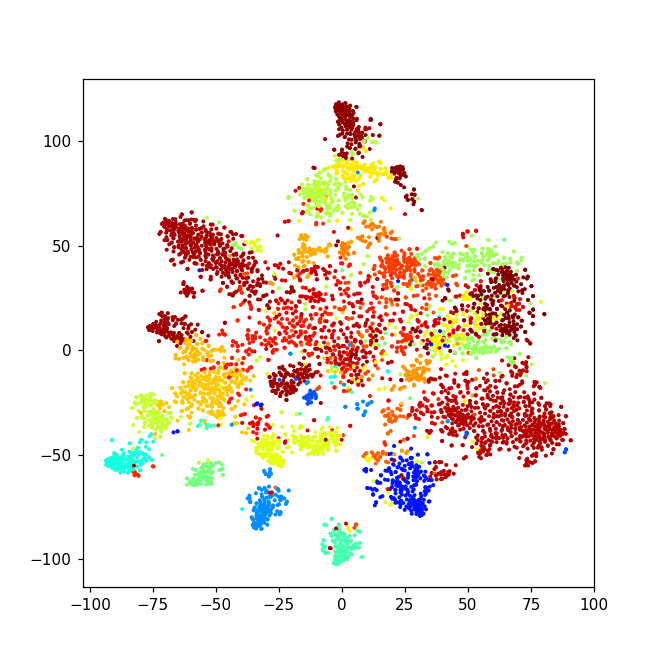

5208


In [793]:
def plot_labels(df, labels_a, standalone=True):
    if standalone == True:
        plt.figure(figsize=(6, 6))
    points = np.zeros((len(df.columns),2))
    for i, n in enumerate(df.columns):
        points[i,:] = tSNE_points[df_fish.columns.get_loc(n),:]
    print(len(points))
    plt.scatter(points[:,0], points[:,1],c=plt.cm.jet(labels_a/max(labels_a)), lw=0, alpha=1, s=7)
        #Color labels
    #plt.scatter(points[:,0], points[:,1],c=label_colors_hex, lw=0, alpha=1, s=15)
    
plot_labels(df_fish_totmol, labels_a)

In [76]:
def plot_cells_pos_labels(labels_a):
    
    coord_df_sort = sort_df(coord_df.loc[:,cellID], labels_a, row_sort=False)
    color_labels_sort =plt.cm.jet(np.sort(labels_a)/max(np.sort(labels_a)))    
    plot_cell_pos(coord_df_sort, cell_ids=None, color=color_labels_sort, s=10, standalone=False, mode='tsne')
        #Color labels: See below, part 10
    #plot_cell_pos(coord_df_sort, cell_ids=None, color=label_colors_hex, s=10, standalone=False, mode='tsne')
    
plot_cells_pos_labels(labels_a)

NameError: name 'sort_df' is not defined

<IPython.core.display.Javascript object>


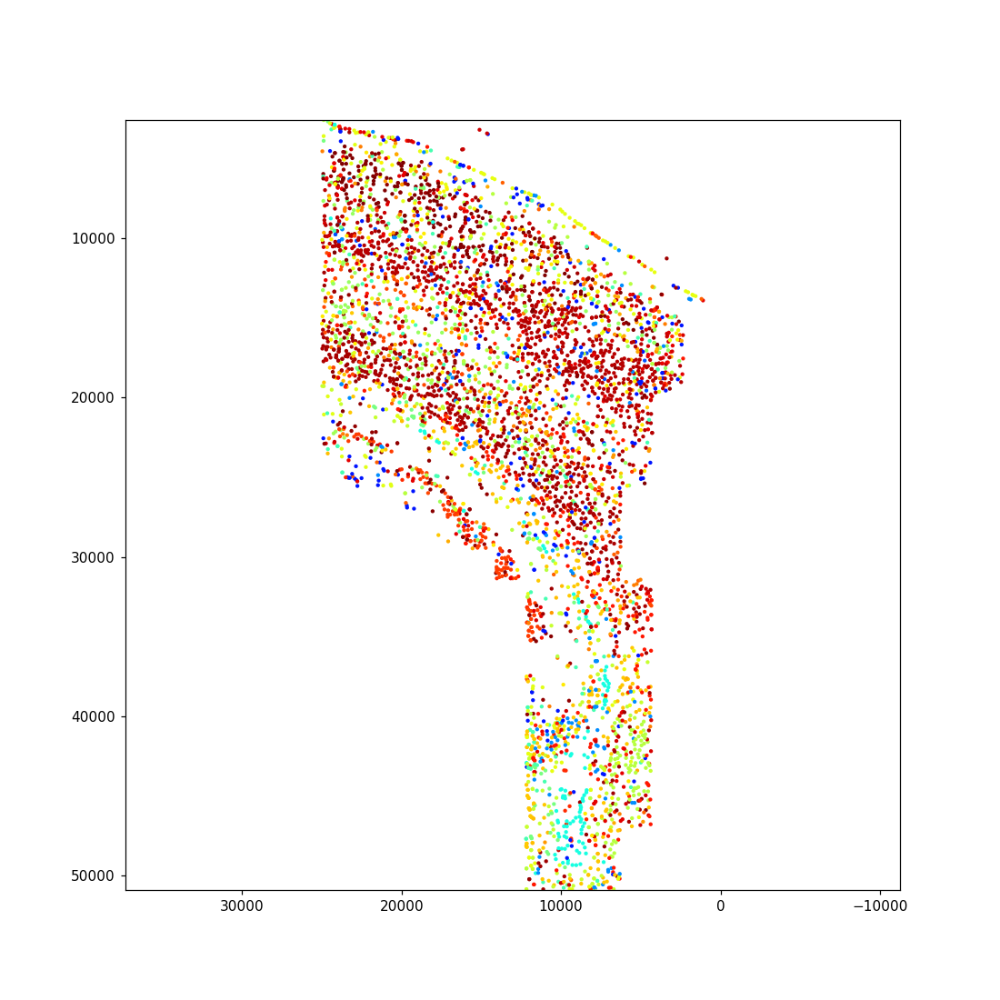

(50892.770878319228, 2602.5350161783608)

In [794]:
plt.figure(figsize=(10,10))
color_labels_sort =plt.cm.jet(labels_a/max(labels_a))
plt.scatter(coord_df.loc['X',:], coord_df.loc['Y',:], linewidths=0, c=color_labels_sort, s=8)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.gca().axis('equal')
plt.xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
plt.ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])

<IPython.core.display.Javascript object>


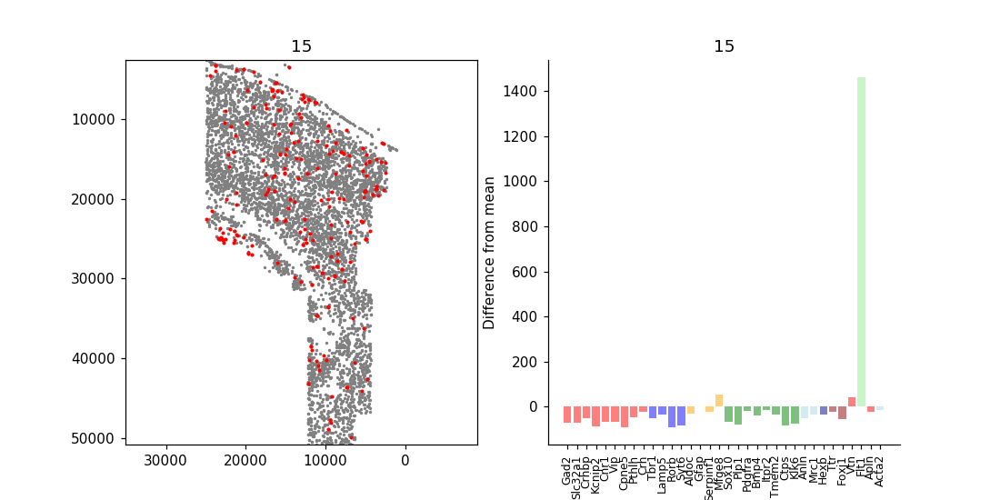

<IPython.core.display.Javascript object>


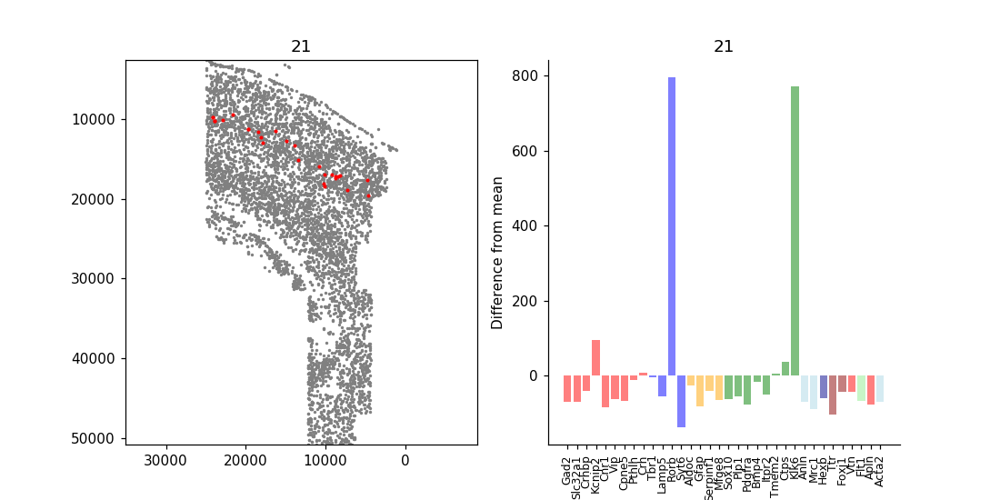

<IPython.core.display.Javascript object>


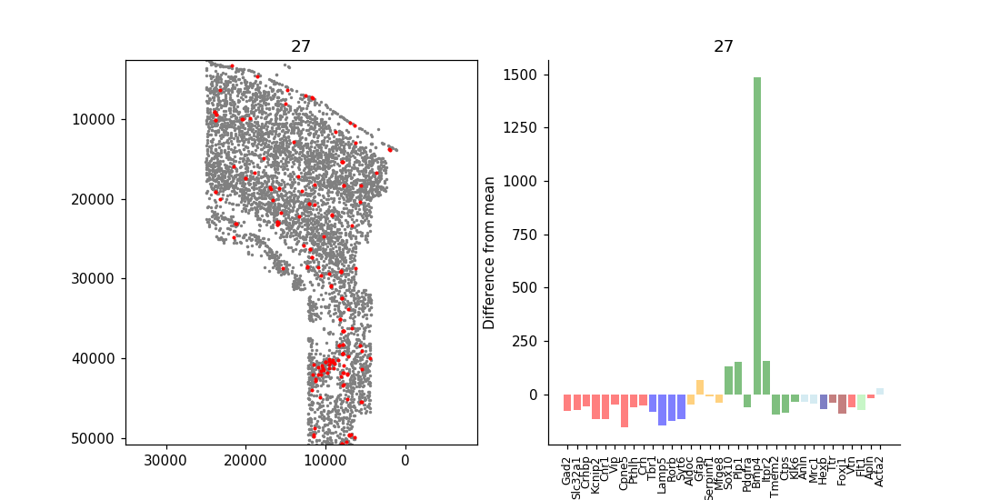

<IPython.core.display.Javascript object>


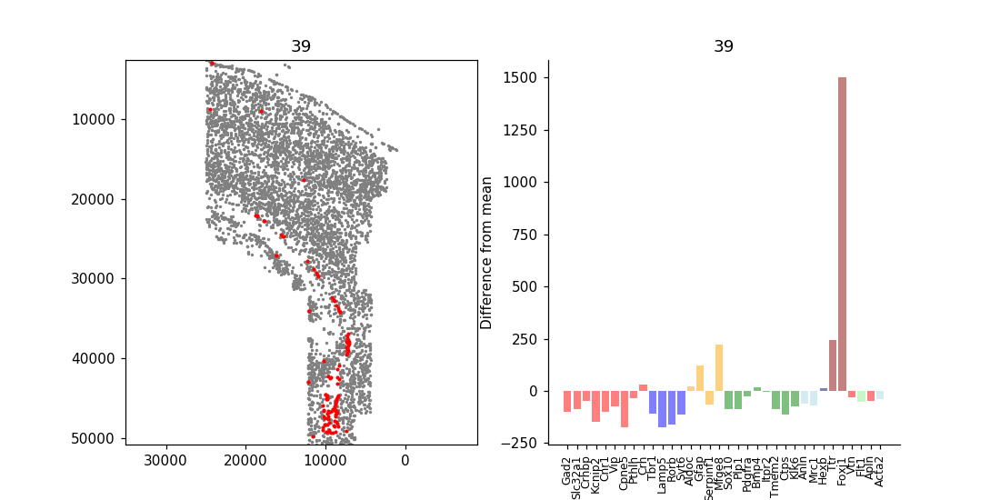

<IPython.core.display.Javascript object>


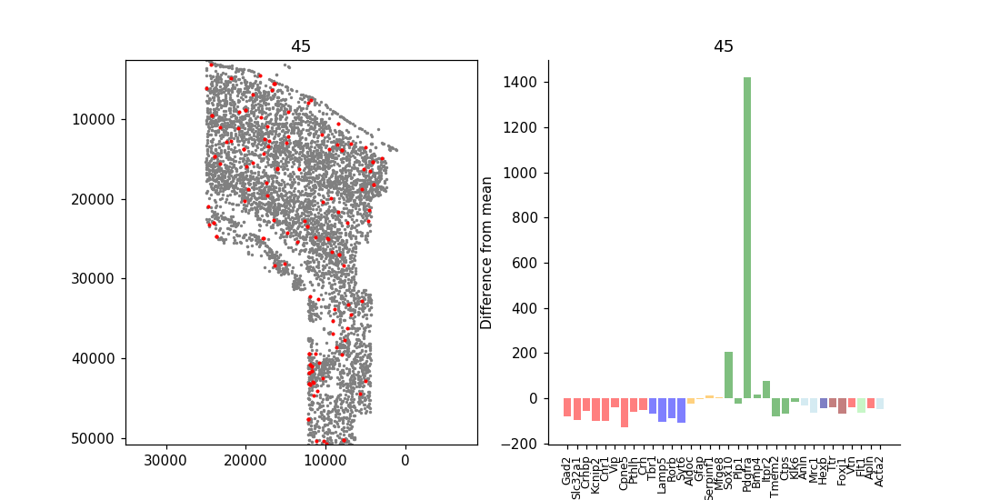

<IPython.core.display.Javascript object>


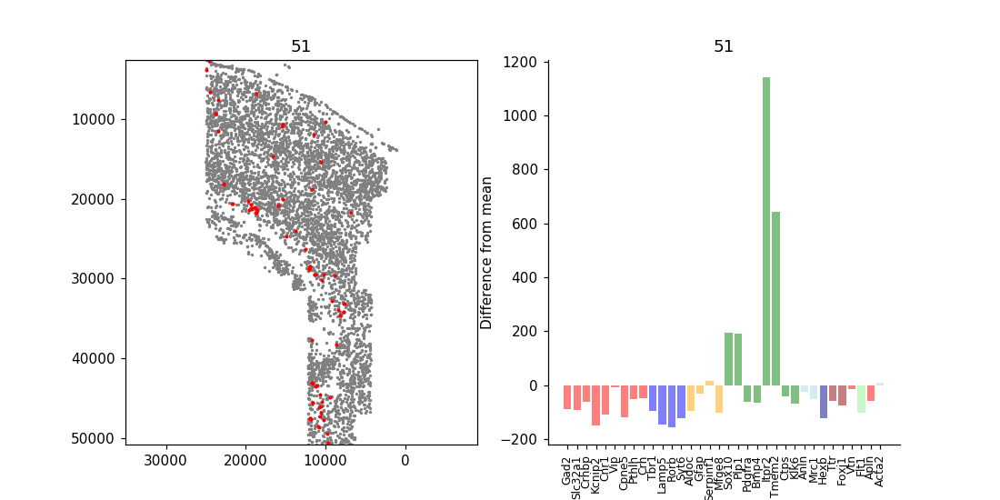

<IPython.core.display.Javascript object>


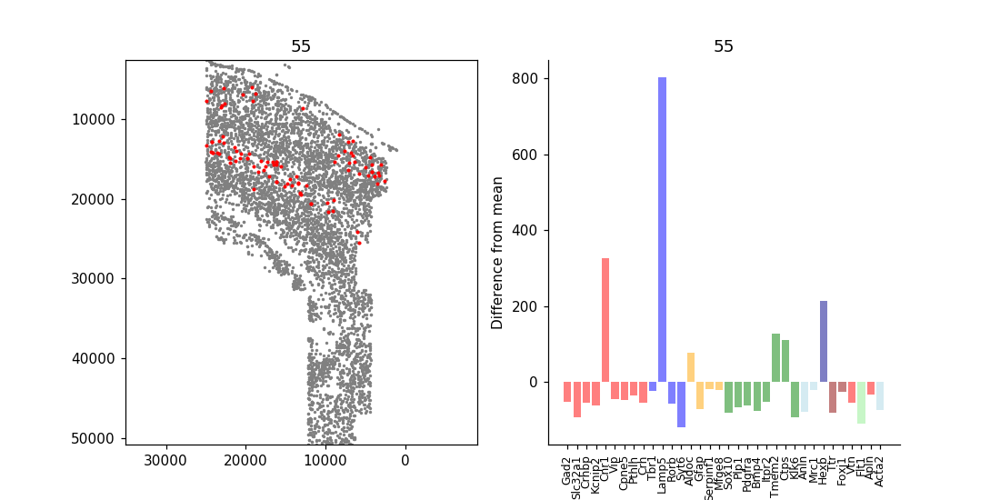

<IPython.core.display.Javascript object>


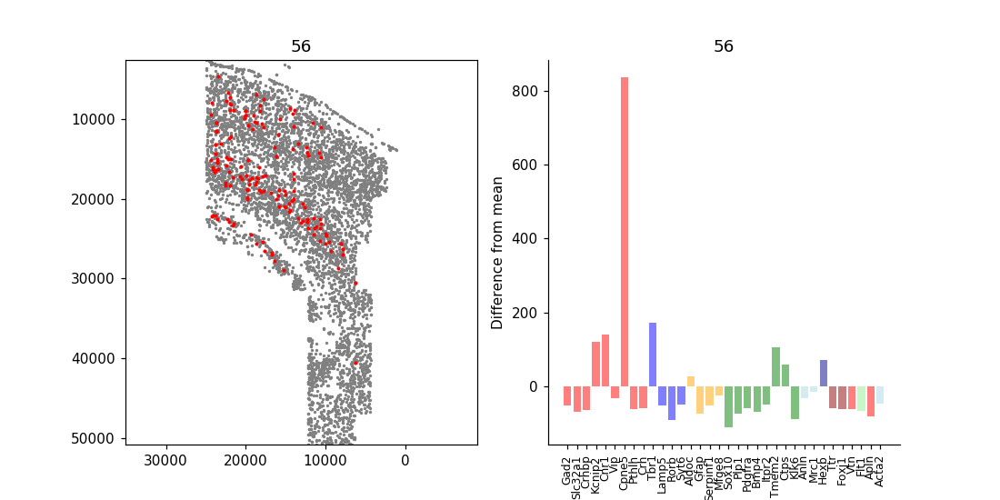

<IPython.core.display.Javascript object>


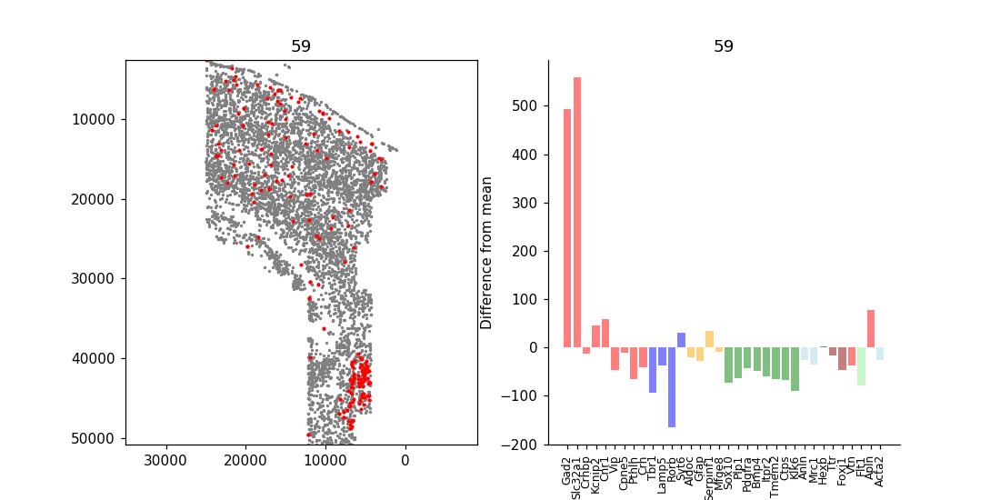

<IPython.core.display.Javascript object>


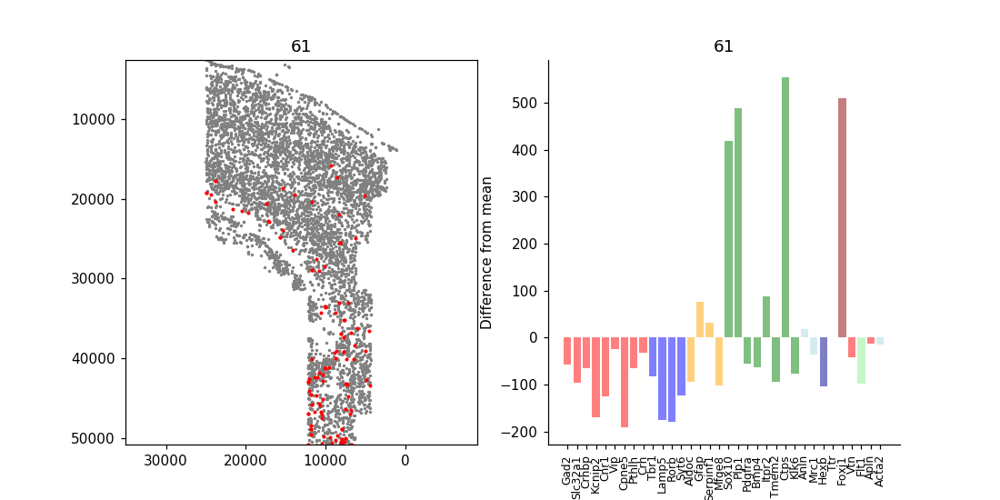

<IPython.core.display.Javascript object>


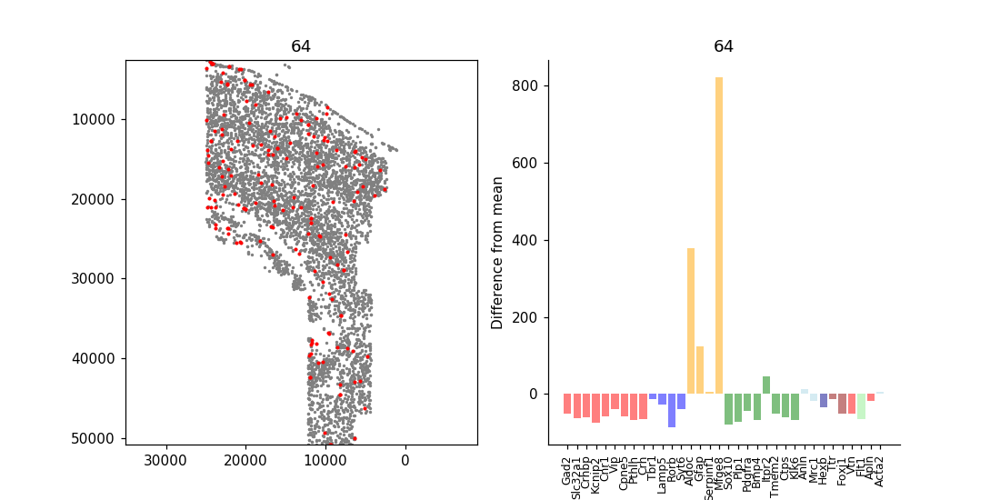

<IPython.core.display.Javascript object>


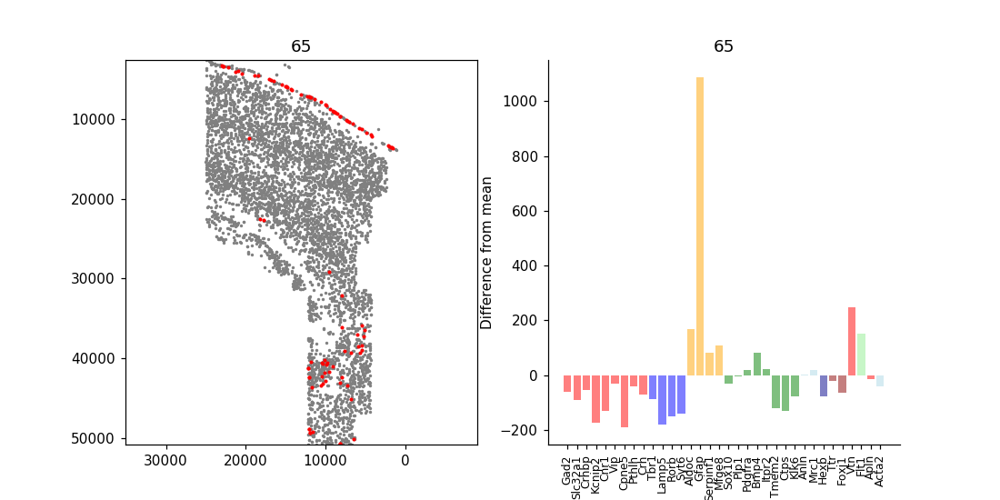

<IPython.core.display.Javascript object>


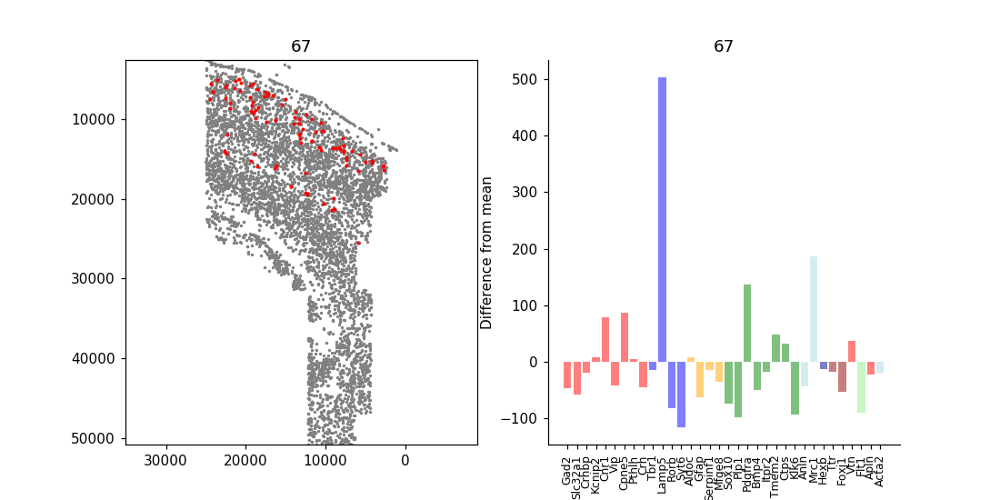

<IPython.core.display.Javascript object>


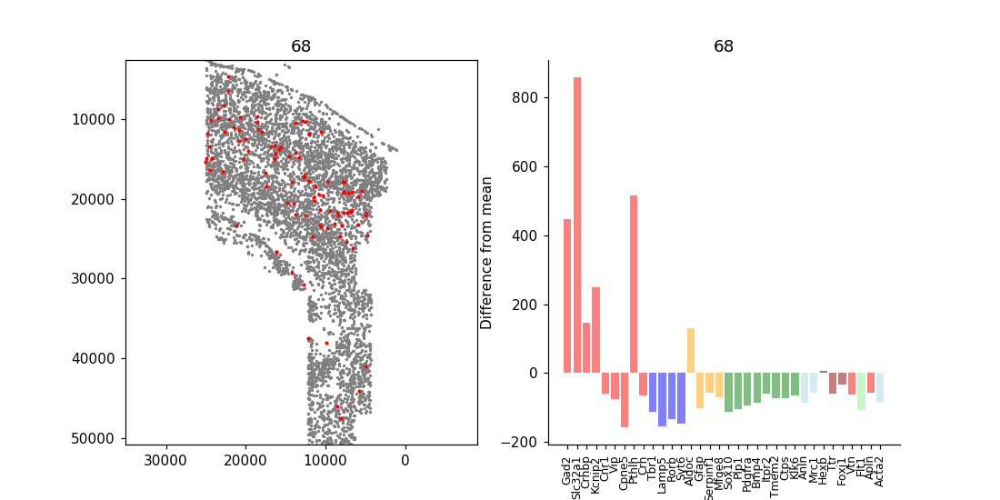

<IPython.core.display.Javascript object>


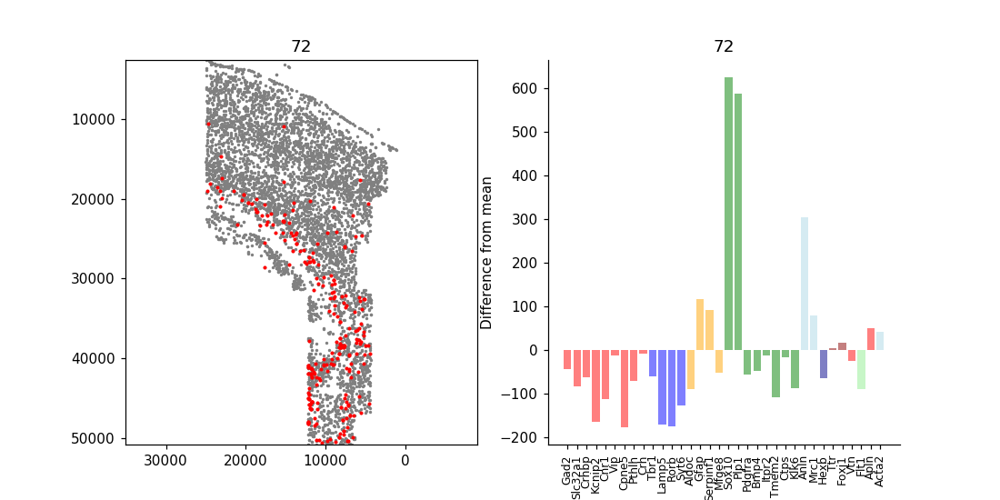

<IPython.core.display.Javascript object>


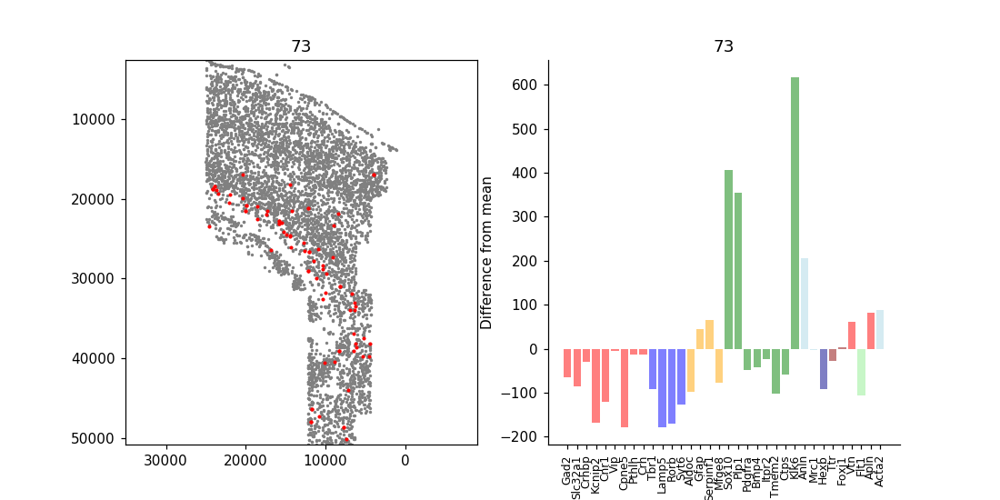

<IPython.core.display.Javascript object>


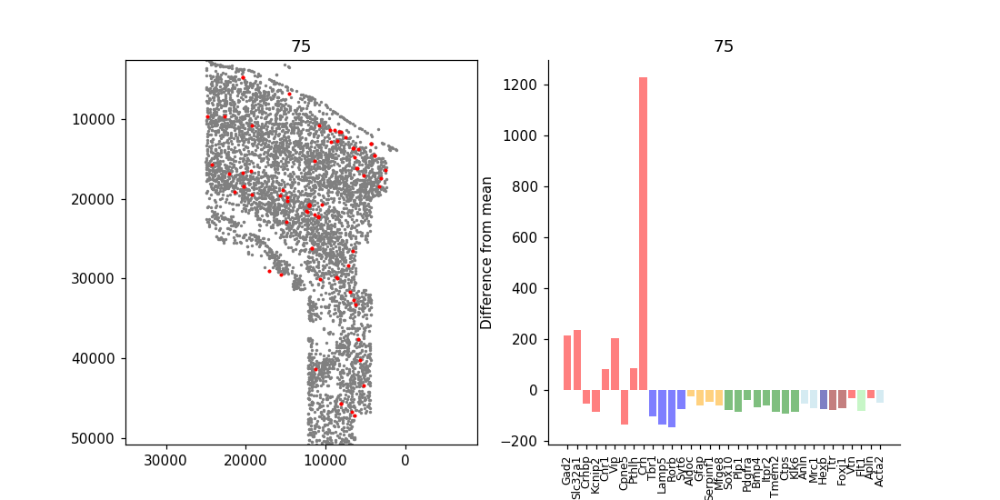

<IPython.core.display.Javascript object>


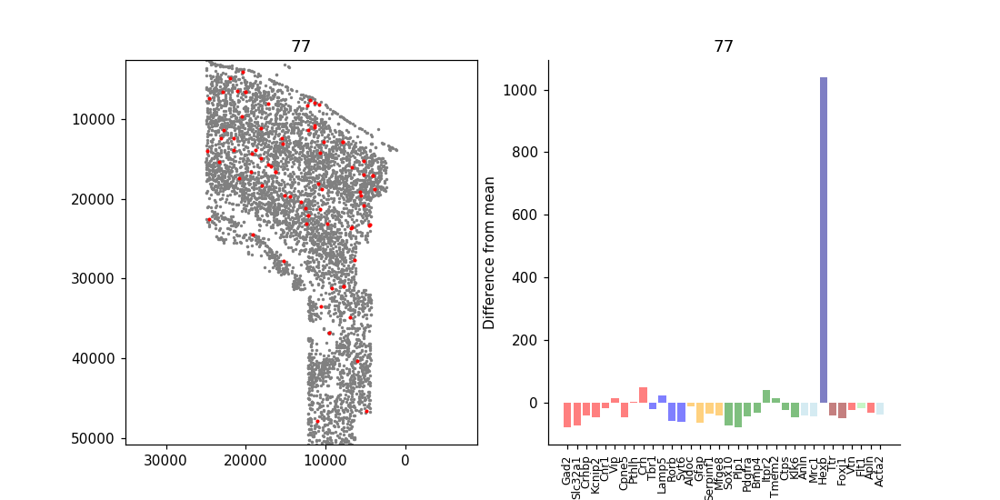

<IPython.core.display.Javascript object>


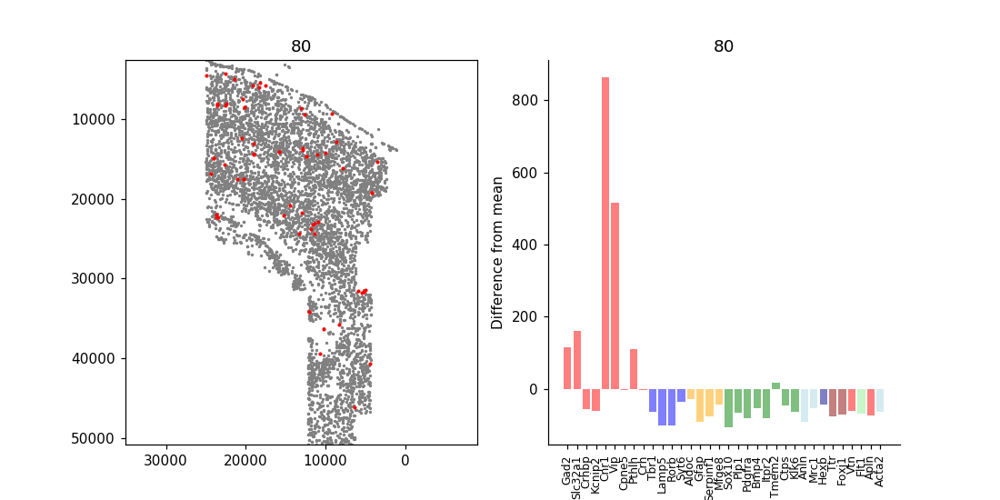

<IPython.core.display.Javascript object>


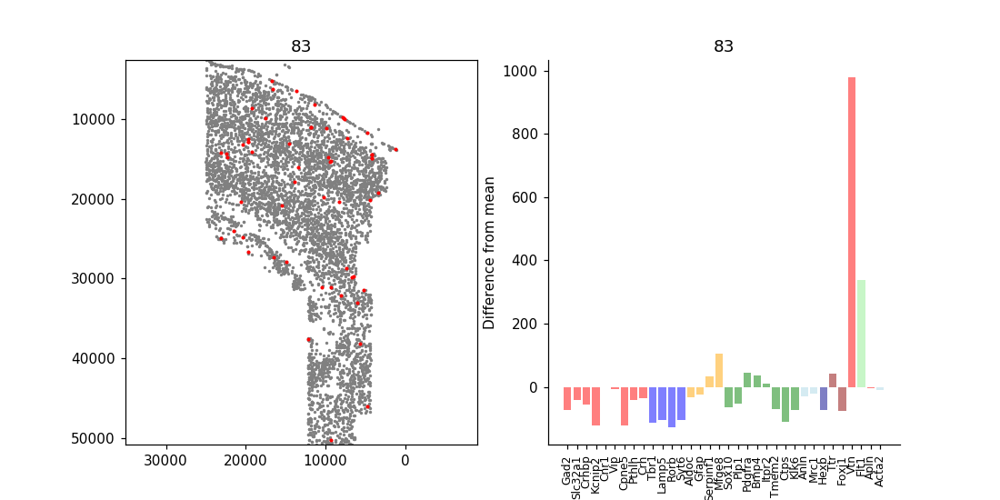

<IPython.core.display.Javascript object>


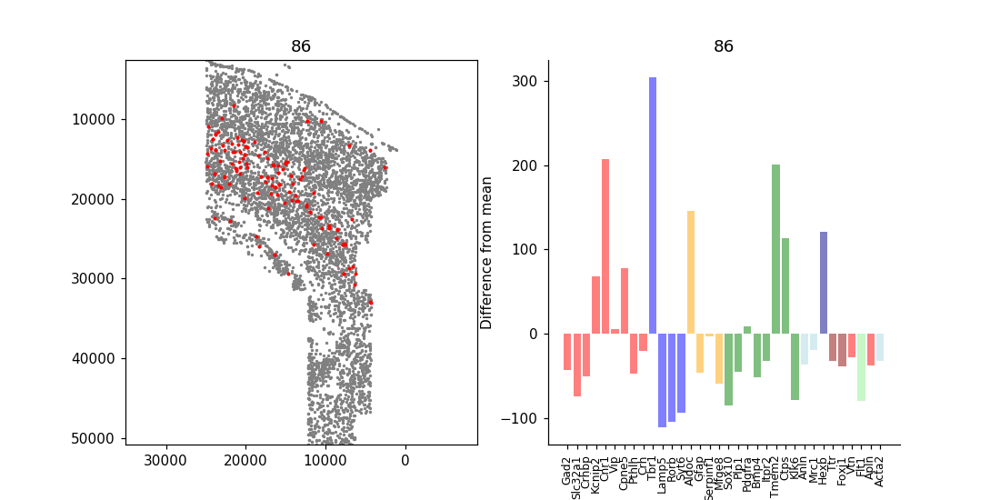

<IPython.core.display.Javascript object>


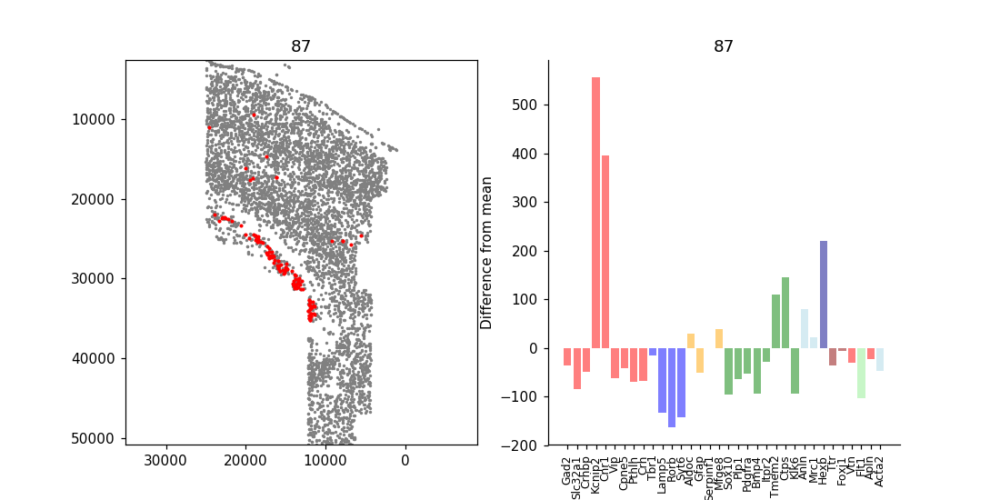

<IPython.core.display.Javascript object>


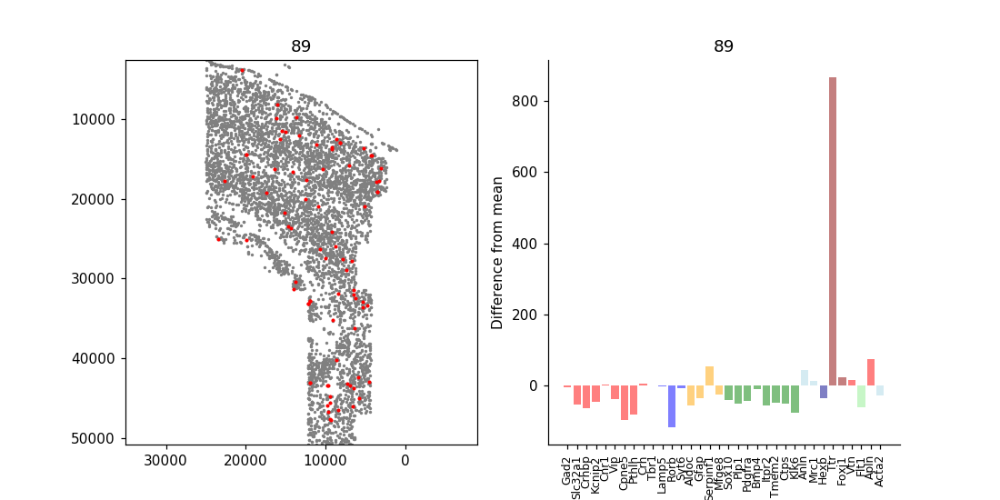

<IPython.core.display.Javascript object>


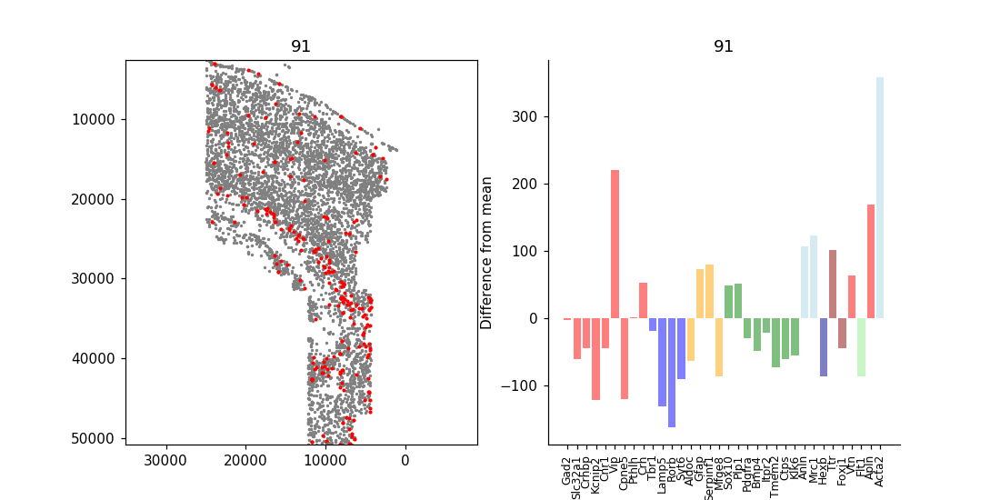

<IPython.core.display.Javascript object>


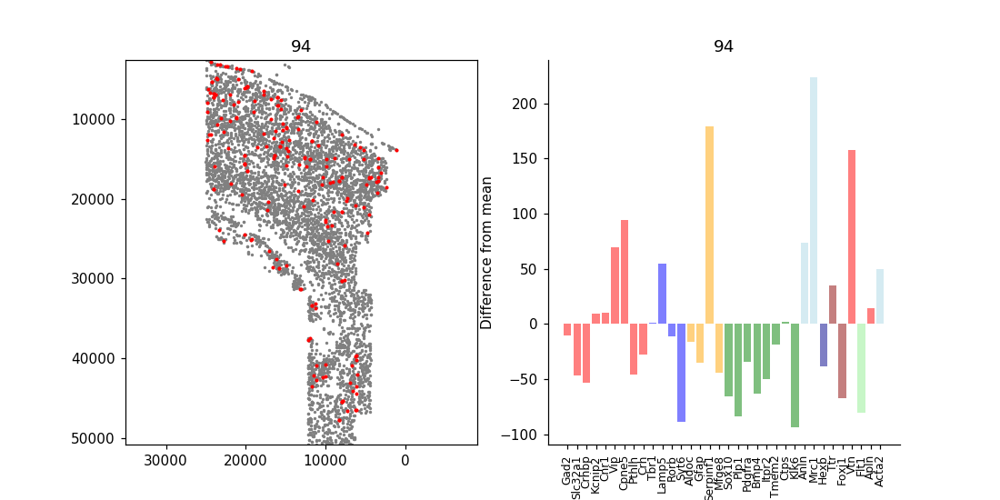

<IPython.core.display.Javascript object>


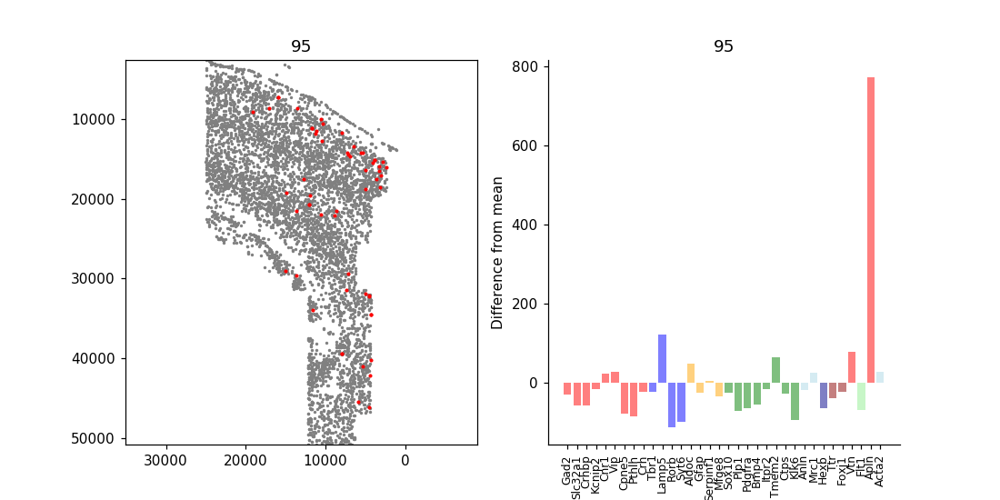

<IPython.core.display.Javascript object>


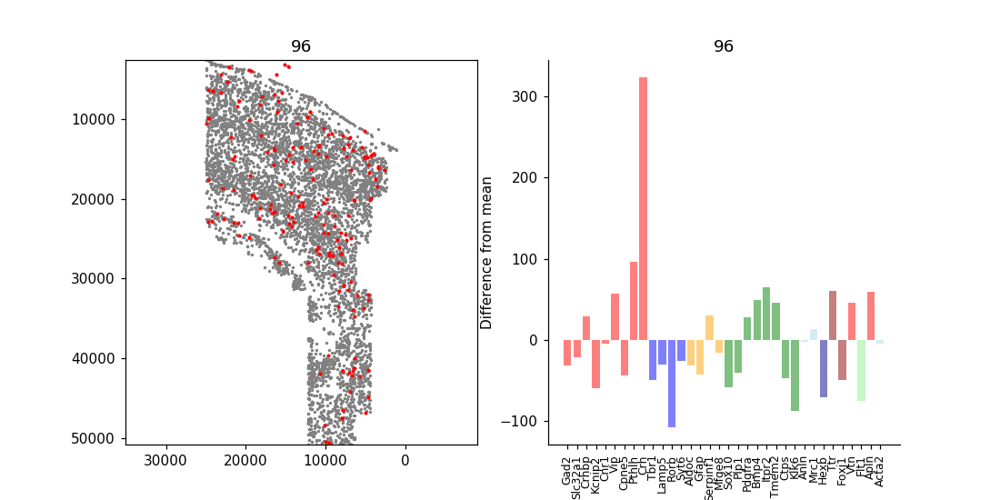

<IPython.core.display.Javascript object>


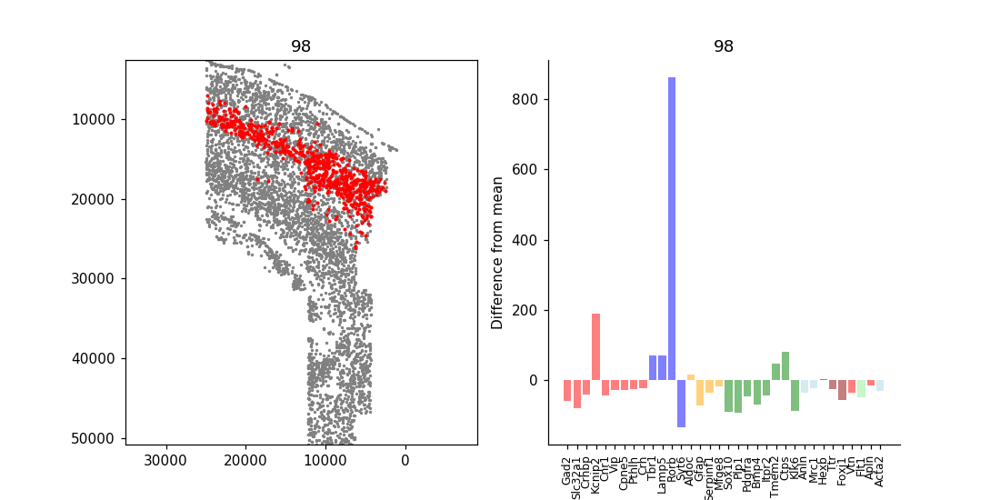

<IPython.core.display.Javascript object>


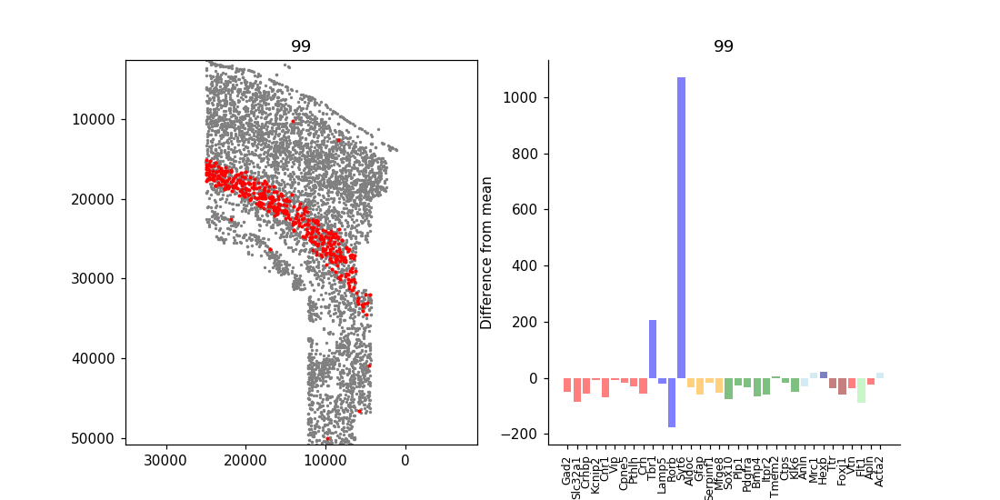

<IPython.core.display.Javascript object>


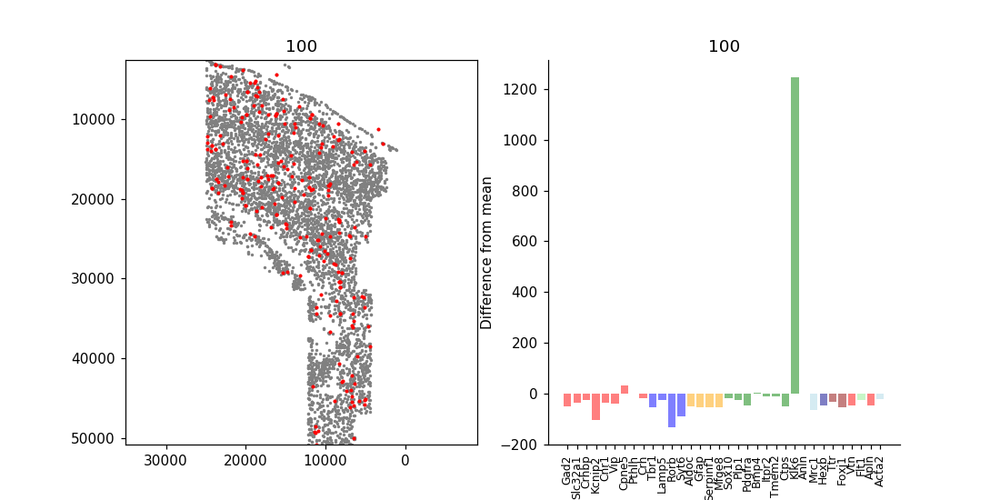

<IPython.core.display.Javascript object>


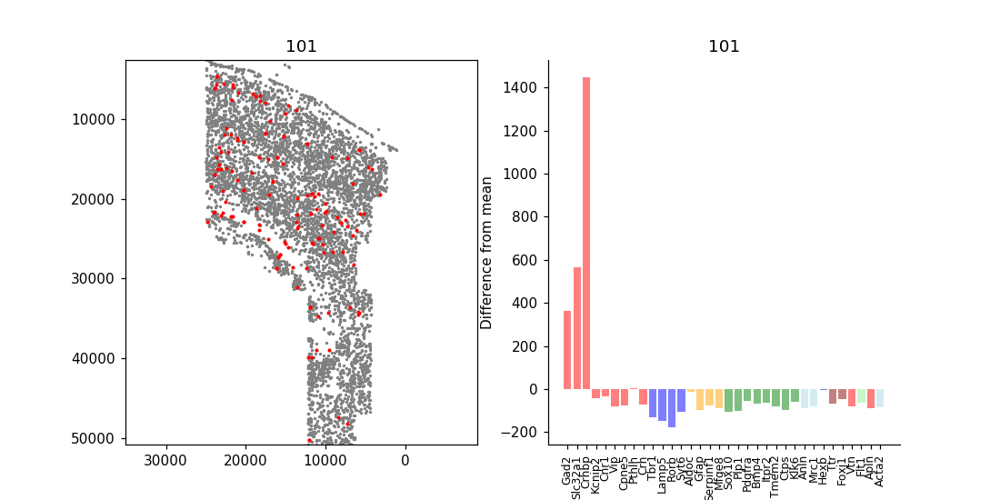

<IPython.core.display.Javascript object>


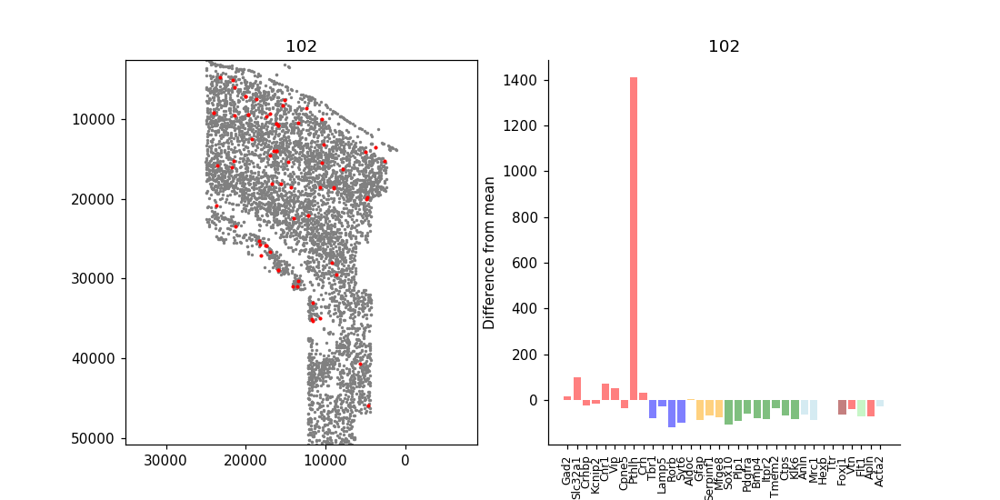

<IPython.core.display.Javascript object>


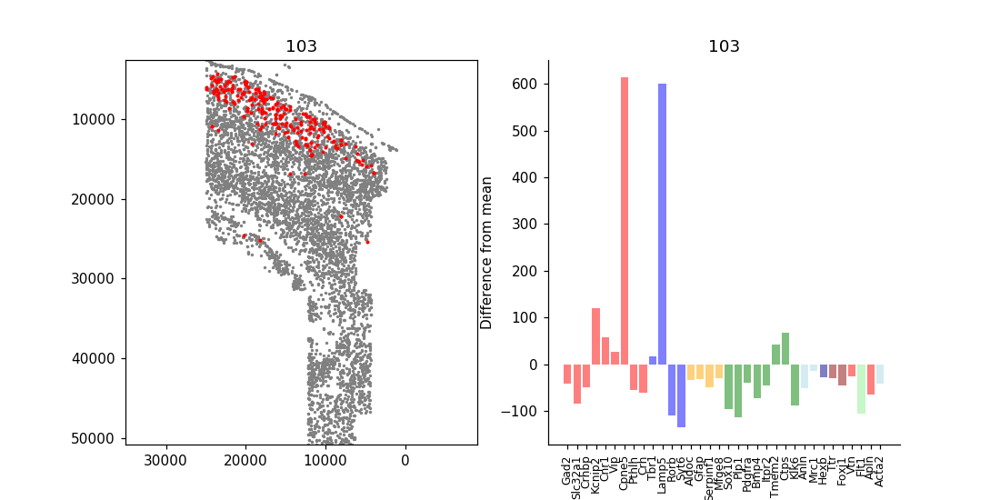

In [795]:

for i in np.unique(labels): 
    fig, (ax1, ax2) = plt.subplots(1,2, sharey=False, figsize=(10,5))
    ax1.scatter(coord_df.loc['X',:], coord_df.loc['Y',:], linewidths=0, c='grey', s=5)
    filt = labels_a == i
    ax1.scatter(coord_df.loc['X',filt], coord_df.loc['Y',filt], linewidths=0, c='red', s=7)
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.axis('equal')
    ax1.set_xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
    ax1.set_ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])
    ax1.set_title(i)
    
    data = df_fish_totmol.loc[:,filt]
    gene_colors = ['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
        'green', 'green', 'green', 'green', 'green',  'green', 'green', 'green',
        'lightblue', 'lightblue', 'darkblue', 'darkred','darkred','red','lightgreen','red','lightblue']
    left_pos = range(data.shape[0])

    ax2.bar(left_pos, data.mean(axis=1) - df_fish_totmol.mean(axis=1), color=gene_colors, alpha=0.5)
    x_lab = [i.split('_')[1] for i in list(df_fish_totmol.index)]
    ax2.set_xticks(left_pos)
    ax2.set_xticklabels(x_lab, rotation='vertical', fontsize=8)
    ax2.spines['right'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.yaxis.set_ticks_position('left')
    ax2.xaxis.set_ticks_position('bottom')
    ax2.set_title(i)
    ax2.set_ylabel('Difference from mean')
   